In [3]:
import os
import random
import shutil
import pathlib
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import tensorflow as tf
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

Preparing dataset...
Downloaded and prepared 3670 images in flower_images

Visualizing random images from the dataset with noise...


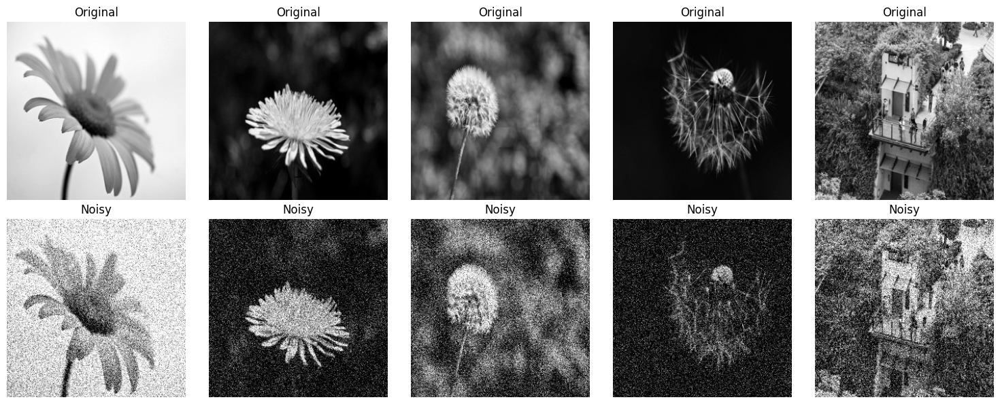


Experimenting with different noise levels...


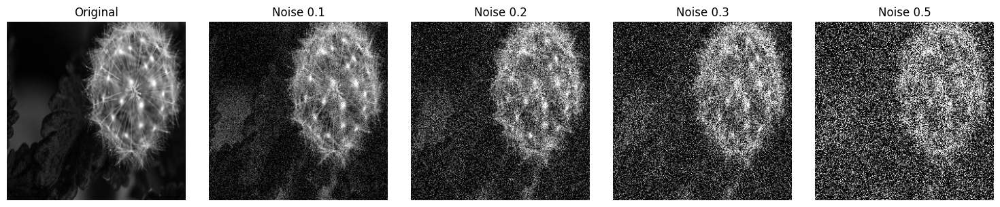


Dataset is ready in directory: flower_images


In [2]:
def download_flower_photos():
    """Download the flower photos dataset and extract it"""
    print("Downloading flower photos dataset...")
    dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
    data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
    data_dir = pathlib.Path(data_dir)
    
    
    simplified_dir = 'flower_images'
    if os.path.exists(simplified_dir):
        shutil.rmtree(simplified_dir)
    os.makedirs(simplified_dir)
    
    print("Preparing dataset...")
    count = 0
    for img_path in data_dir.glob('*/*.jpg'):
        
        shutil.copy(str(img_path), os.path.join(simplified_dir, f"flower_{count}.jpg"))
        count += 1
    
    print(f"Downloaded and prepared {count} images in {simplified_dir}")
    return simplified_dir

class ImageDataset(Dataset):
    def __init__(self, image_dir, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(image_dir) 
                          if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
    def __len__(self):
        return len(self.image_files)
    
    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        image_path = os.path.join(self.image_dir, img_name)
        image = Image.open(image_path).convert('RGB')
        
        # Convert image to grayscale
        image = ImageOps.grayscale(image)
        
        if self.transform:
            image = self.transform(image)
            
        return image, img_name

def add_noise(image, noise_factor=0.2):
    noisy_image = image + noise_factor * torch.randn(*image.shape)
    return torch.clip(noisy_image, 0., 1.)

def visualize_dataset(data_dir, num_images=5):
    """Visualize some random images from the dataset"""
    transform = transforms.Compose([
        transforms.Resize((256, 256)), 
        transforms.Grayscale(num_output_channels=1),  
        transforms.ToTensor()
    ])
    
    dataset = ImageDataset(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=num_images, shuffle=True)
    
    images, filenames = next(iter(dataloader))
    
    fig, axes = plt.subplots(2, num_images, figsize=(15, 6))
    
    for i in range(num_images):
        img = images[i].squeeze(0) 
        axes[0, i].imshow(img, cmap='gray') 
        axes[0, i].axis('off')
        axes[0, i].set_title('Original')
        
        noisy_img = add_noise(images[i])
        axes[1, i].imshow(noisy_img.squeeze(0), cmap='gray') 
        axes[1, i].axis('off')
        axes[1, i].set_title('Noisy')
    
    plt.tight_layout()
    plt.show()

def experiment_with_noise_levels(data_dir):
    """Experiment with different noise levels on a single image"""
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  
        transforms.Grayscale(num_output_channels=1),  
        transforms.ToTensor()
    ])
    
    image_files = os.listdir(data_dir)
    image_path = os.path.join(data_dir, random.choice(image_files))
    image = Image.open(image_path).convert('RGB')
    image = ImageOps.grayscale(image)  
    image_tensor = transform(image)
    
    noise_levels = [0.1, 0.2, 0.3, 0.5]
    
    fig, axes = plt.subplots(1, len(noise_levels) + 1, figsize=(15, 3))
    
    axes[0].imshow(image_tensor.squeeze(0), cmap='gray')  
    axes[0].axis('off')
    axes[0].set_title('Original')
    
    for i, noise_factor in enumerate(noise_levels, 1):
        noisy_image = add_noise(image_tensor, noise_factor)
        axes[i].imshow(noisy_image.squeeze(0), cmap='gray')  
        axes[i].axis('off')
        axes[i].set_title(f'Noise {noise_factor}')
    
    plt.tight_layout()
    plt.show()

def main():
    
    data_dir = download_flower_photos()
    
    print("\nVisualizing random images from the dataset with noise...")
    visualize_dataset(data_dir)
    
    print("\nExperimenting with different noise levels...")
    experiment_with_noise_levels(data_dir)
    
    return data_dir

if __name__ == '__main__':
    data_dir = main()
    print(f"\nDataset is ready in directory: {data_dir}")

Found 3670 images in flower_images

Training model with bias...
Using device: cpu


Epoch 1/10: 100%|██████████| 115/115 [14:42<00:00,  7.67s/it, loss=0.00467]


Epoch [1/10], Loss: 0.010242


Epoch 2/10: 100%|██████████| 115/115 [14:10<00:00,  7.40s/it, loss=0.00369]


Epoch [2/10], Loss: 0.004498


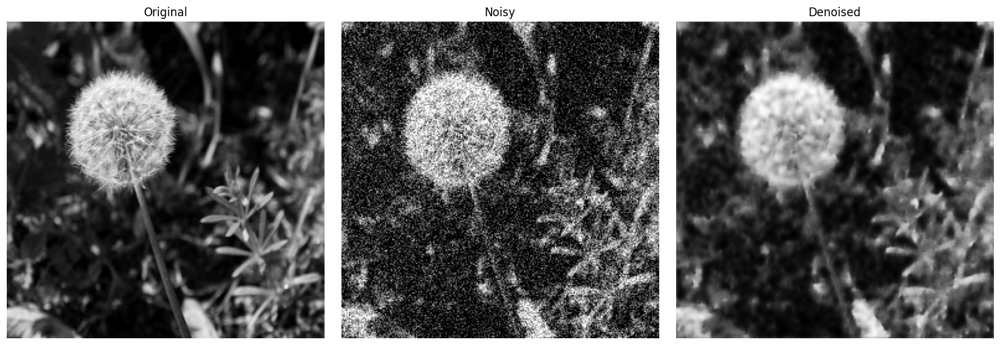

Epoch 3/10: 100%|██████████| 115/115 [13:58<00:00,  7.29s/it, loss=0.00569]


Epoch [3/10], Loss: 0.004343


Epoch 4/10: 100%|██████████| 115/115 [13:48<00:00,  7.21s/it, loss=0.00592]


Epoch [4/10], Loss: 0.004113


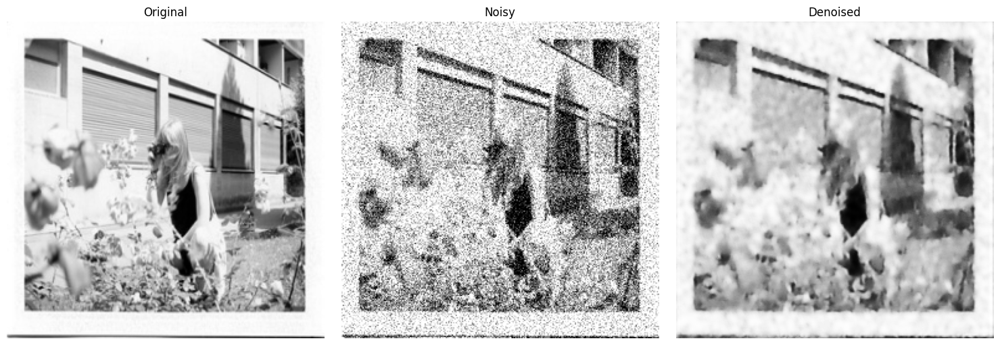

Epoch 5/10: 100%|██████████| 115/115 [13:51<00:00,  7.23s/it, loss=0.00423]


Epoch [5/10], Loss: 0.004167


Epoch 6/10: 100%|██████████| 115/115 [13:51<00:00,  7.23s/it, loss=0.00435]


Epoch [6/10], Loss: 0.004008


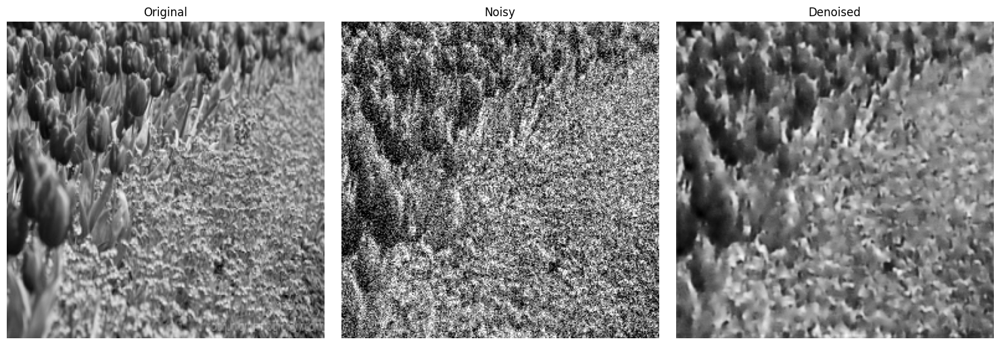

Epoch 7/10: 100%|██████████| 115/115 [13:42<00:00,  7.15s/it, loss=0.00382]


Epoch [7/10], Loss: 0.003849


Epoch 8/10: 100%|██████████| 115/115 [13:53<00:00,  7.24s/it, loss=0.00375]


Epoch [8/10], Loss: 0.003895


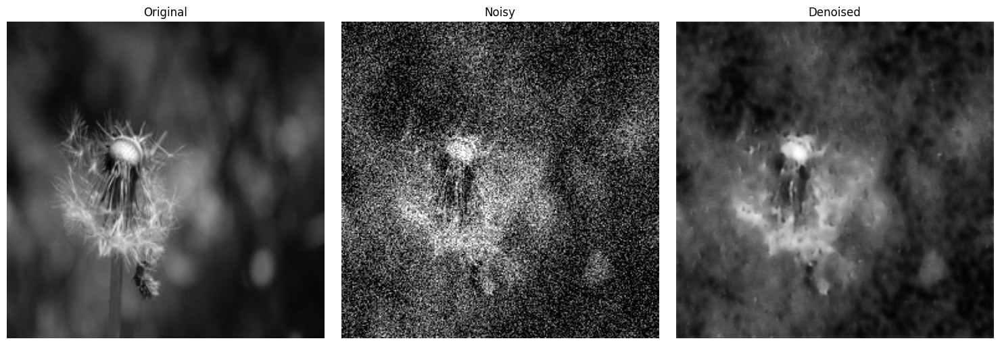

Epoch 9/10: 100%|██████████| 115/115 [13:47<00:00,  7.20s/it, loss=0.00482]


Epoch [9/10], Loss: 0.003868


Epoch 10/10: 100%|██████████| 115/115 [13:50<00:00,  7.22s/it, loss=0.00365]


Epoch [10/10], Loss: 0.003893


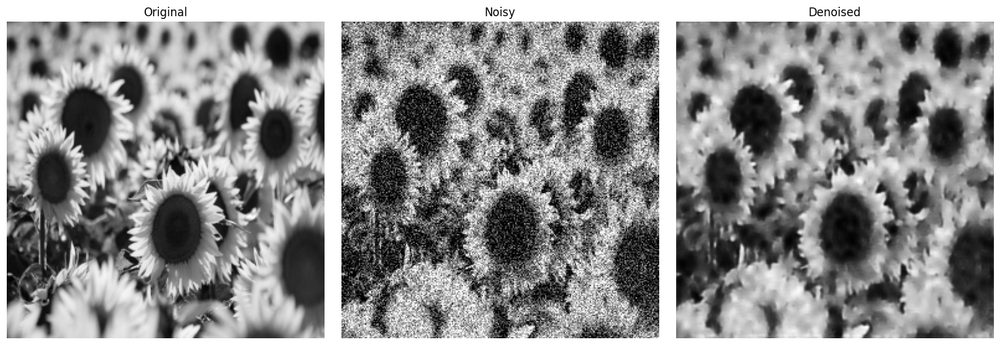

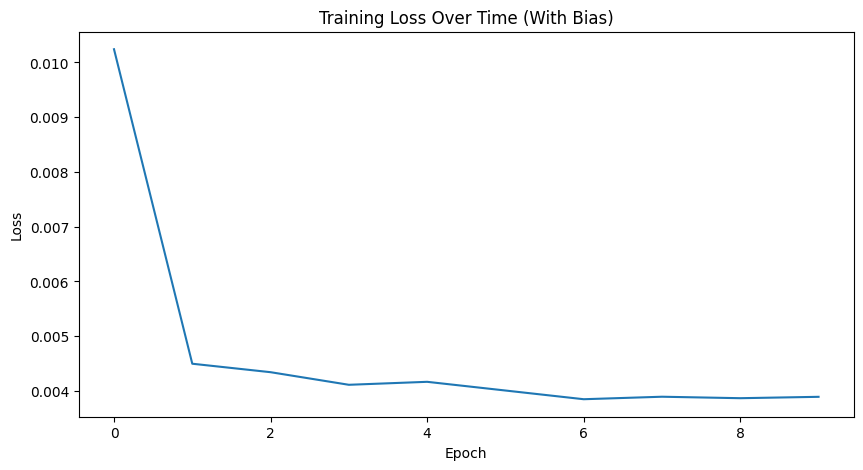

Model with bias saved as 'denoiser_model_with_bias.pth'

Training model without bias...
Using device: cpu


Epoch 1/10: 100%|██████████| 115/115 [13:31<00:00,  7.05s/it, loss=0.00455]


Epoch [1/10], Loss: 0.009794


Epoch 2/10: 100%|██████████| 115/115 [13:34<00:00,  7.08s/it, loss=0.00503]


Epoch [2/10], Loss: 0.004848


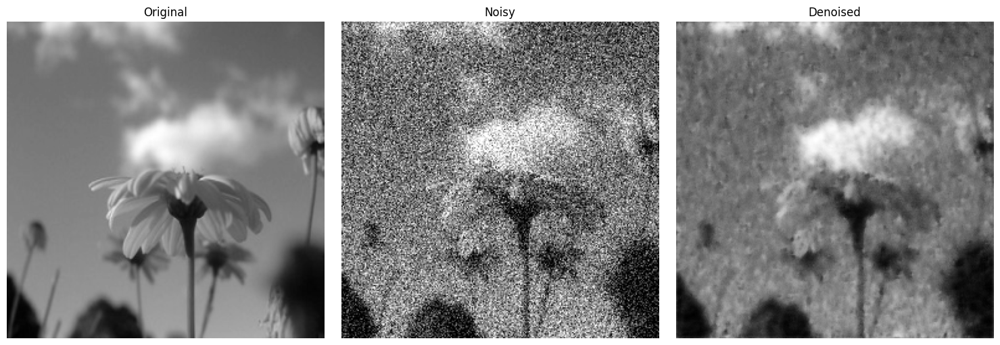

Epoch 3/10: 100%|██████████| 115/115 [14:46<00:00,  7.70s/it, loss=0.0037] 


Epoch [3/10], Loss: 0.004339


Epoch 4/10: 100%|██████████| 115/115 [18:07<00:00,  9.46s/it, loss=0.00335]


Epoch [4/10], Loss: 0.004281


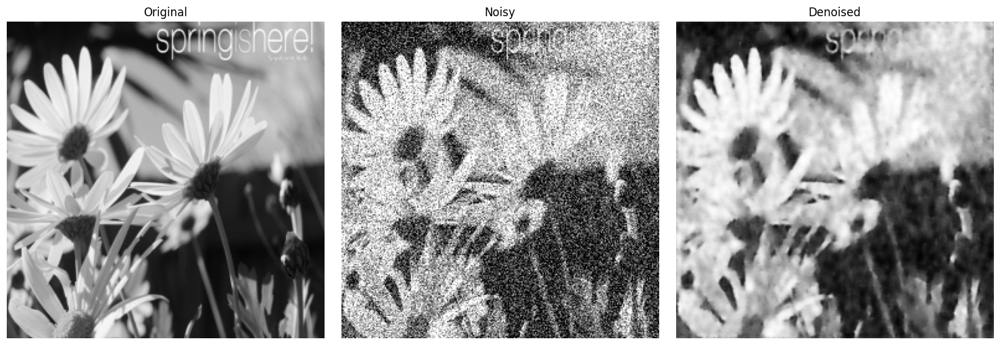

Epoch 5/10: 100%|██████████| 115/115 [18:13<00:00,  9.50s/it, loss=0.00384]


Epoch [5/10], Loss: 0.004112


Epoch 6/10: 100%|██████████| 115/115 [18:11<00:00,  9.50s/it, loss=0.00404]


Epoch [6/10], Loss: 0.003975


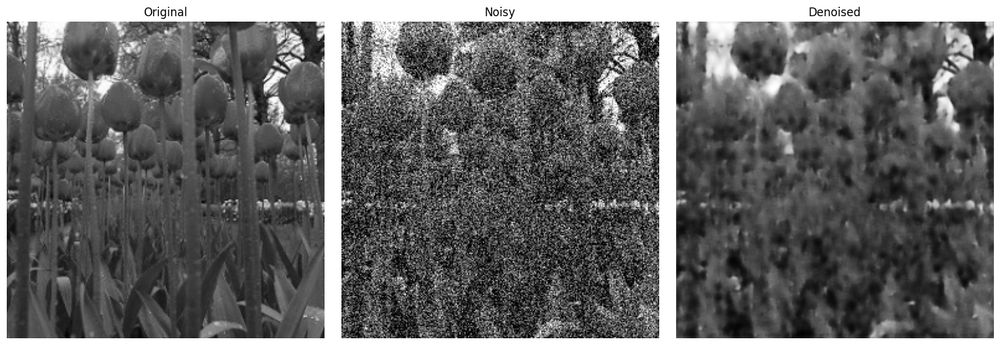

Epoch 7/10: 100%|██████████| 115/115 [14:09<00:00,  7.39s/it, loss=0.00374]


Epoch [7/10], Loss: 0.004057


Epoch 8/10: 100%|██████████| 115/115 [14:07<00:00,  7.37s/it, loss=0.00417]


Epoch [8/10], Loss: 0.004055


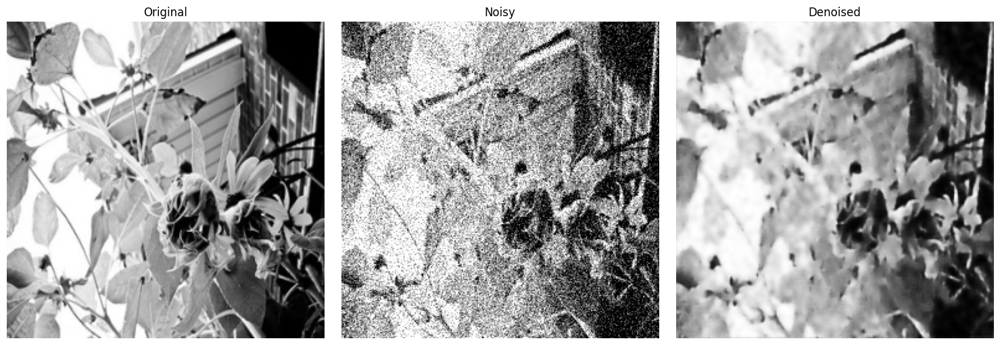

Epoch 9/10: 100%|██████████| 115/115 [14:09<00:00,  7.38s/it, loss=0.00312]


Epoch [9/10], Loss: 0.003999


Epoch 10/10: 100%|██████████| 115/115 [14:03<00:00,  7.34s/it, loss=0.00386]


Epoch [10/10], Loss: 0.003844


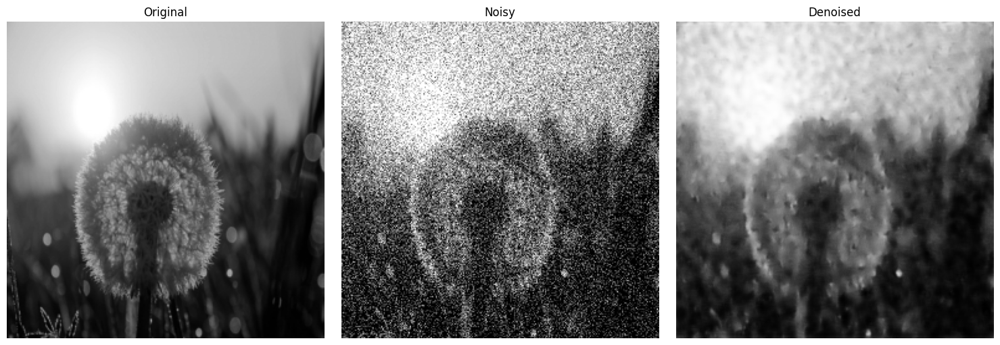

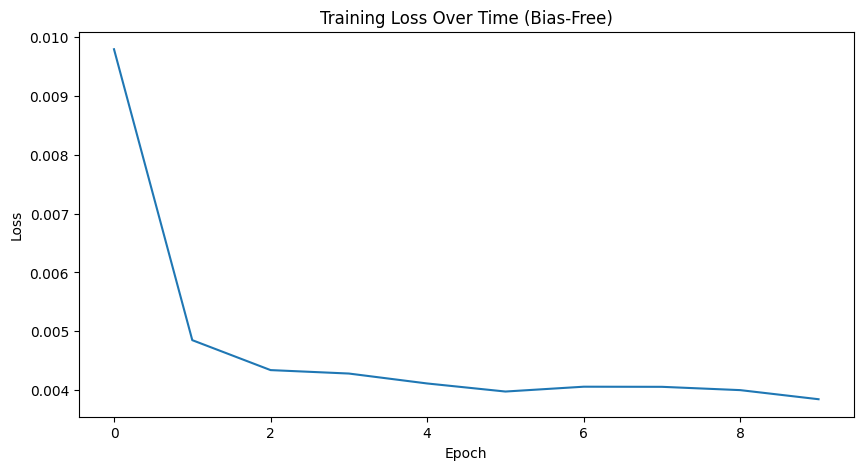

Model without bias saved as 'denoiser_model_without_bias.pth'


In [5]:
class Denoiser(nn.Module):
    def __init__(self, use_bias=True):
        
        super(Denoiser, self).__init__()
        
        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1, bias=use_bias),  
            nn.ReLU(True),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 16, kernel_size=3, padding=1, bias=use_bias),
            nn.ReLU(True),
            nn.BatchNorm2d(16)
        )
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Conv2d(16, 32, kernel_size=3, padding=1, bias=use_bias),
            nn.ReLU(True),
            nn.BatchNorm2d(32),
            nn.Conv2d(32, 1, kernel_size=3, padding=1, bias=use_bias), 
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x


def train_denoiser(data_dir, use_bias, num_epochs=10):
    """
    Train the denoiser model.
    :param data_dir: Directory containing the images.
    :param use_bias: Set to True for the model with bias, False for bias-free model.
    :param num_epochs: Number of training epochs.
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    
    transform = transforms.Compose([
        transforms.Resize((256, 256)),  
        transforms.Grayscale(num_output_channels=1), 
        transforms.ToTensor()
    ])
    
    
    dataset = ImageDataset(data_dir, transform=transform)
    dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=0)
    
  
    model = Denoiser(use_bias=use_bias).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    
    train_losses = []
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        progress_bar = tqdm(dataloader, desc=f'Epoch {epoch+1}/{num_epochs}')
        
        for batch in progress_bar:
            try:
                
                clean_images = batch[0].to(device) 
                noisy_images = add_noise(clean_images)
                
                
                outputs = model(noisy_images)
                loss = criterion(outputs, clean_images)
                
                
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                
               
                running_loss += loss.item()
                progress_bar.set_postfix({'loss': loss.item()})
                
            except Exception as e:
                print(f"Error in training batch: {str(e)}")
                continue
        
        
        epoch_loss = running_loss / len(dataloader)
        train_losses.append(epoch_loss)
        print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {epoch_loss:.6f}')
        
       
        if (epoch + 1) % 2 == 0:
            visualize_results(model, dataset, device)
    
    # Plot training losses
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses)
    plt.title(f'Training Loss Over Time ({"With Bias" if use_bias else "Bias-Free"})')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show()
    
    return model


def visualize_results(model, dataset, device):
    model.eval()
    with torch.no_grad():
       
        idx = random.randint(0, len(dataset) - 1)
        clean_image, _ = dataset[idx]
        clean_image = clean_image.unsqueeze(0).to(device)  
      
        noisy_image = add_noise(clean_image)
        denoised_image = model(noisy_image)
        
   
        clean_image = clean_image.cpu().squeeze(0).squeeze(0)  
        noisy_image = noisy_image.cpu().squeeze(0).squeeze(0)
        denoised_image = denoised_image.cpu().squeeze(0).squeeze(0)
        
        # Plot results
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        axes[0].imshow(clean_image, cmap='gray')
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        axes[1].imshow(noisy_image, cmap='gray')
        axes[1].set_title('Noisy')
        axes[1].axis('off')
        
        axes[2].imshow(denoised_image, cmap='gray')
        axes[2].set_title('Denoised')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()


if __name__ == '__main__':
    try:
        data_dir = 'flower_images'
        
    
        if not os.path.exists(data_dir):
            raise FileNotFoundError(f"Directory {data_dir} not found")
            
        image_files = [f for f in os.listdir(data_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        if not image_files:
            raise Exception(f"No image files found in {data_dir}")
            
        print(f"Found {len(image_files)} images in {data_dir}")
        
       
        print("\nTraining model with bias...")
        model_with_bias = train_denoiser(data_dir, use_bias=True, num_epochs=10)
        torch.save(model_with_bias.state_dict(), 'denoiser_model_with_bias.pth')
        print("Model with bias saved as 'denoiser_model_with_bias.pth'")
        
    
        print("\nTraining model without bias...")
        model_without_bias = train_denoiser(data_dir, use_bias=False, num_epochs=10)
        torch.save(model_without_bias.state_dict(), 'denoiser_model_without_bias.pth')
        print("Model without bias saved as 'denoiser_model_without_bias.pth'")
        
    except Exception as e:
        print(f"An error occurred: {str(e)}")

Using device: cpu


C:\Users\lenonvo\AppData\Local\Temp\ipykernel_5600\2974519921.py:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_path, map_location=

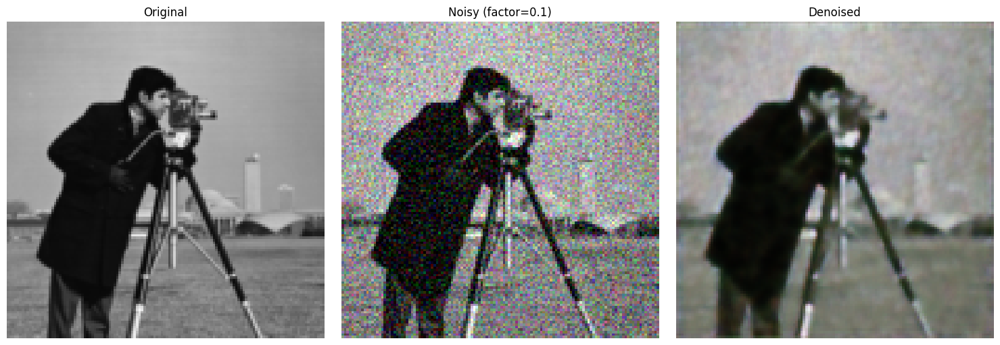

Error processing image: pic should not have > 4 channels. Got 128 channels.


In [14]:
def denoise_image(model_path, image_path, noise_factor=0.2):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    print(f"Using device: {device}")
    
    
    model = Denoiser()  
    model.load_state_dict(torch.load(model_path, map_location=device))
    model.to(device)
    model.eval()
    
    # Prepare image transform
    transform = transforms.Compose([
        transforms.Resize((128, 128)),
        transforms.ToTensor()
    ])
    
    try:
       
        image = Image.open(image_path).convert('RGB')
        original_size = image.size 
        
       
        image_tensor = transform(image).unsqueeze(0).to(device)
        
       
        noisy_image = add_noise(image_tensor, noise_factor)
        
       
        with torch.no_grad():
            denoised_image = model(noisy_image)
        
        
        original_image = image_tensor.cpu().squeeze(0).permute(1, 2, 0)
        noisy_image = noisy_image.cpu().squeeze(0).permute(1, 2, 0)
        denoised_image = denoised_image.cpu().squeeze(0).permute(1, 2, 0)
        
        
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))
        
        axes[0].imshow(original_image)
        axes[0].set_title('Original')
        axes[0].axis('off')
        
        axes[1].imshow(noisy_image)
        axes[1].set_title(f'Noisy (factor={noise_factor})')
        axes[1].axis('off')
        
        axes[2].imshow(denoised_image)
        axes[2].set_title('Denoised')
        axes[2].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        
        denoised_image_pil = transforms.ToPILImage()(denoised_image)
        denoised_image_pil = denoised_image_pil.resize(original_size) 
        save_path = os.path.splitext(image_path)[0] + '_denoised.png'
        denoised_image_pil.save(save_path)
        print(f"Denoised image saved as: {save_path}")
        
    except Exception as e:
        print(f"Error processing image: {str(e)}")



if __name__ == "__main__":
    
    model_path = 'denoiser_model.pth'  
    image_path = 'test_images/cameraman.tif'  
    denoise_image(model_path, image_path, noise_factor=0.1)